In [1]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import pandas_datareader as pdr
import quantstats as qs
from scipy.optimize import minimize
from scipy import stats
from scipy.signal import correlate
from scipy.stats import pearsonr

/var/folders/q7/rl1ql8s51w7g6407mjltrv0r0000gn/T/ipykernel_31367/972265961.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


/Users/nilkanthpatel/anaconda3/envs/FINA6339/lib/python3.11/site-packages/yfinance/utils.py:775: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/Users/nilkanthpatel/anaconda3/envs/FINA6339/lib/python3.11/site-packages/yfinance/utils.py:775: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
[                       0%%                      ]/Users/nilkanthpatel/anaconda3/envs/FINA6339/lib/python3.11/site-packages/yfinance/utils.py:775: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/Users/nilkanthpatel/anaconda3/envs/FINA6339/li

/var/folders/q7/rl1ql8s51w7g6407mjltrv0r0000gn/T/ipykernel_31367/4119950795.py:29: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  cumulative_returns = (data.pct_change() + 1).cumprod()


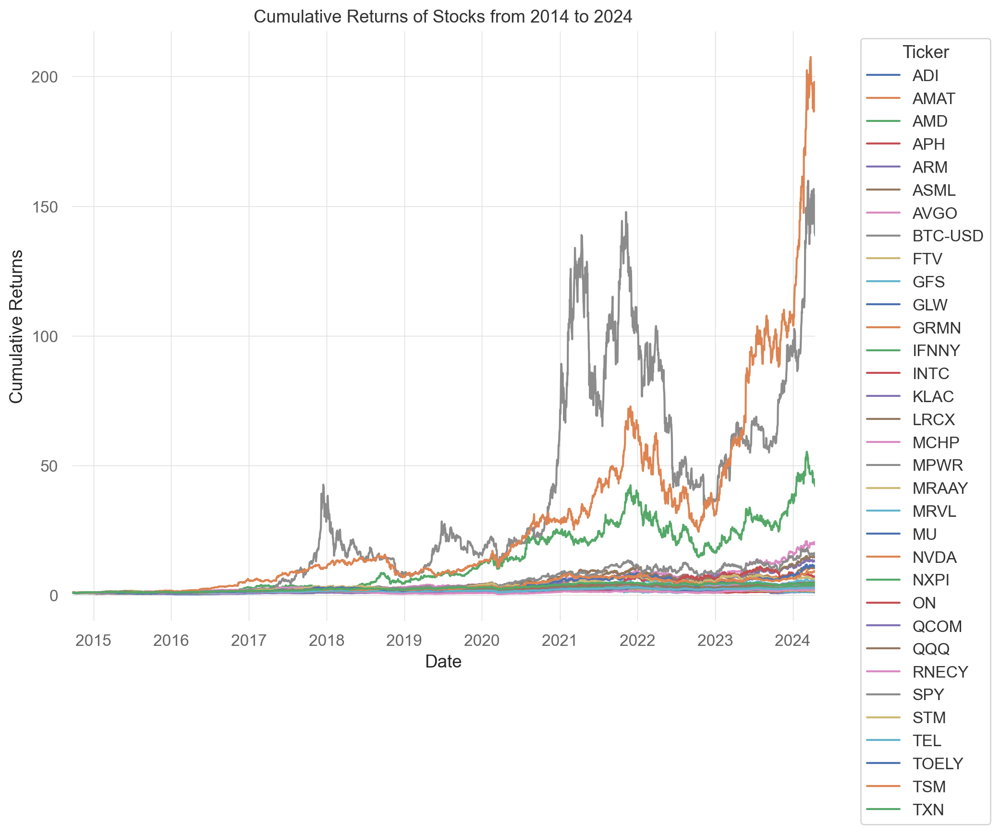

In [2]:

# Set inline backend for high-resolution plotting
%config InlineBackend.figure_format = 'retina'

# Define ticker symbols
tickers = [
    "NVDA", "TSM", "AVGO", "ASML", "AMD", "QCOM", "AMAT", "INTC",
    "TXN", "MU", "LRCX", "TOELY", "ARM", "ADI", "KLAC", "APH", "NXPI",
    "MRVL", "MCHP", "IFNNY", "TEL", "STM", "MRAAY", "MPWR", "RNECY", 
    "FTV", "ON", "GRMN", "GLW", "GFS", "SPY", "QQQ", "BTC-USD"
]

# Set the start and end dates
start_date = '2014-09-17'
end_date = '2024-04-17'

# Download historical adjusted close data for the tickers
data = yf.download(tickers, start=start_date, end=end_date)['Adj Close']

# Display the correlation matrix
correlation_matrix = data.corr()

# Plot the heatmap for correlation matrix
plt.figure(figsize=(50, 50))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Correlation Matrix of Assets')
plt.show()

# Calculate cumulative returns
cumulative_returns = (data.pct_change() + 1).cumprod()
cumulative_returns.plot(figsize=(10, 8))
# Plot cumulative returns of stocks
plt.title('Cumulative Returns of Stocks from 2014 to 2024')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.legend(title='Ticker', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


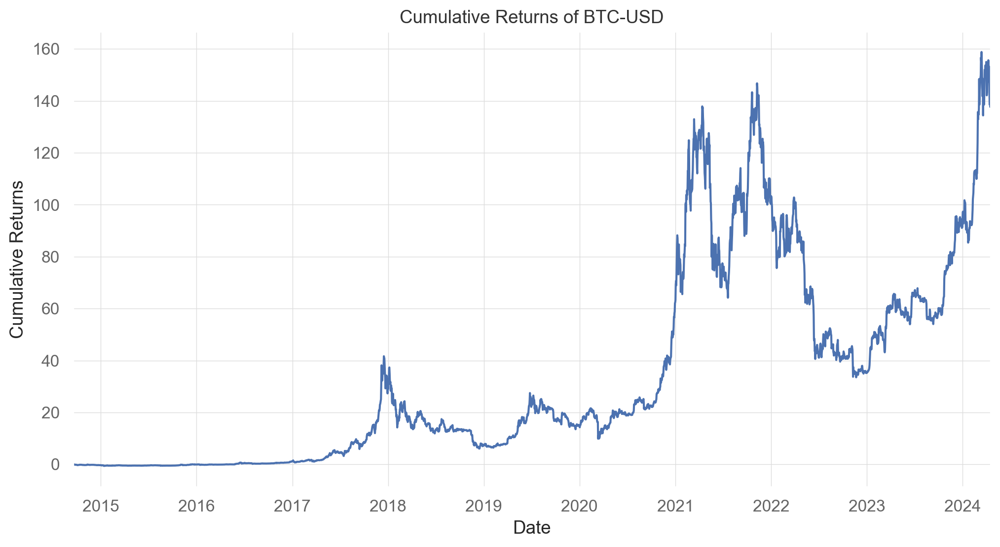

In [3]:

# Calculate daily returns for BTC-USD
daily_returns = data['BTC-USD'].pct_change()

# Calculate cumulative returns for BTC-USD
cumulative_returns = (1 + daily_returns).cumprod() - 1

# Plot cumulative returns for BTC-USD
plt.figure(figsize=(12, 6))
cumulative_returns.plot()
plt.title('Cumulative Returns of BTC-USD')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.grid(True)
plt.show()


In [9]:

# Create a DataFrame for BTC-USD with rolling max and drawdown calculation
filtered_btc = pd.DataFrame(data['BTC-USD'])
filtered_btc['Rolling Max'] = filtered_btc['BTC-USD'].rolling(window=365, min_periods=1).max()
filtered_btc['Drawdown'] = (filtered_btc['BTC-USD'] - filtered_btc['Rolling Max']) / filtered_btc['Rolling Max']

# Initialize bear market tracking variables
bear_markets = []
in_bear_market = False
bear_start = None
post_bear_market_peak = None
lowest_point = None

# Identify bear markets
for date, row in filtered_btc.iterrows():
    if not in_bear_market:
        if post_bear_market_peak is None or row['BTC-USD'] >= post_bear_market_peak:
            post_bear_market_peak = row['BTC-USD']
        elif row['BTC-USD'] < post_bear_market_peak * 0.8:
            in_bear_market = True
            bear_start = date
            lowest_point = row['BTC-USD']
    else:
        if row['BTC-USD'] < lowest_point:
            lowest_point = row['BTC-USD']
        elif row['BTC-USD'] >= post_bear_market_peak * 0.8:
            bear_markets.append({
                'Bear Start': bear_start,
                'Bear End': date,
                'Lowest Point': lowest_point,
                'Post Bear Market Peak': post_bear_market_peak
            })
            in_bear_market = False
            post_bear_market_peak = None
            bear_start = None
            lowest_point = None
        else:
        # Update bear market detection logic
            if row['BTC-USD'] < lowest_point:
                lowest_point = row['BTC-USD']
            if row['BTC-USD'] >= lowest_point * 1.2:
                bear_markets.append((bear_start, date))
                in_bear_market = False
                post_bear_market_peak = row['BTC-USD']
print(bear_markets)           

[{'Bear Start': Timestamp('2014-10-03 00:00:00'), 'Bear End': Timestamp('2014-10-12 00:00:00'), 'Lowest Point': 320.510009765625, 'Post Bear Market Peak': 457.3340148925781}, (Timestamp('2014-12-16 00:00:00'), Timestamp('2015-01-19 00:00:00')), {'Bear Start': Timestamp('2015-01-31 00:00:00'), 'Bear End': Timestamp('2015-02-01 00:00:00'), 'Lowest Point': 217.46400451660156, 'Post Bear Market Peak': 273.4729919433594}, {'Bear Start': Timestamp('2015-04-10 00:00:00'), 'Bear End': Timestamp('2015-05-03 00:00:00'), 'Lowest Point': 219.15899658203125, 'Post Bear Market Peak': 296.3789978027344}, {'Bear Start': Timestamp('2015-08-18 00:00:00'), 'Bear End': Timestamp('2015-10-13 00:00:00'), 'Lowest Point': 210.4949951171875, 'Post Bear Market Peak': 310.86700439453125}, {'Bear Start': Timestamp('2015-11-11 00:00:00'), 'Bear End': Timestamp('2015-11-12 00:00:00'), 'Lowest Point': 311.0840148925781, 'Post Bear Market Peak': 411.56298828125}, {'Bear Start': Timestamp('2016-01-15 00:00:00'), 'Bear

Unexpected format in bear_markets: {'Bear Start': Timestamp('2014-10-03 00:00:00'), 'Bear End': Timestamp('2014-10-12 00:00:00'), 'Lowest Point': 320.510009765625, 'Post Bear Market Peak': 457.3340148925781}
Bear market started on 2014-12-16 and ended on 2015-01-19
Unexpected format in bear_markets: {'Bear Start': Timestamp('2015-01-31 00:00:00'), 'Bear End': Timestamp('2015-02-01 00:00:00'), 'Lowest Point': 217.46400451660156, 'Post Bear Market Peak': 273.4729919433594}
Unexpected format in bear_markets: {'Bear Start': Timestamp('2015-04-10 00:00:00'), 'Bear End': Timestamp('2015-05-03 00:00:00'), 'Lowest Point': 219.15899658203125, 'Post Bear Market Peak': 296.3789978027344}
Unexpected format in bear_markets: {'Bear Start': Timestamp('2015-08-18 00:00:00'), 'Bear End': Timestamp('2015-10-13 00:00:00'), 'Lowest Point': 210.4949951171875, 'Post Bear Market Peak': 310.86700439453125}
Unexpected format in bear_markets: {'Bear Start': Timestamp('2015-11-11 00:00:00'), 'Bear End': Timestam

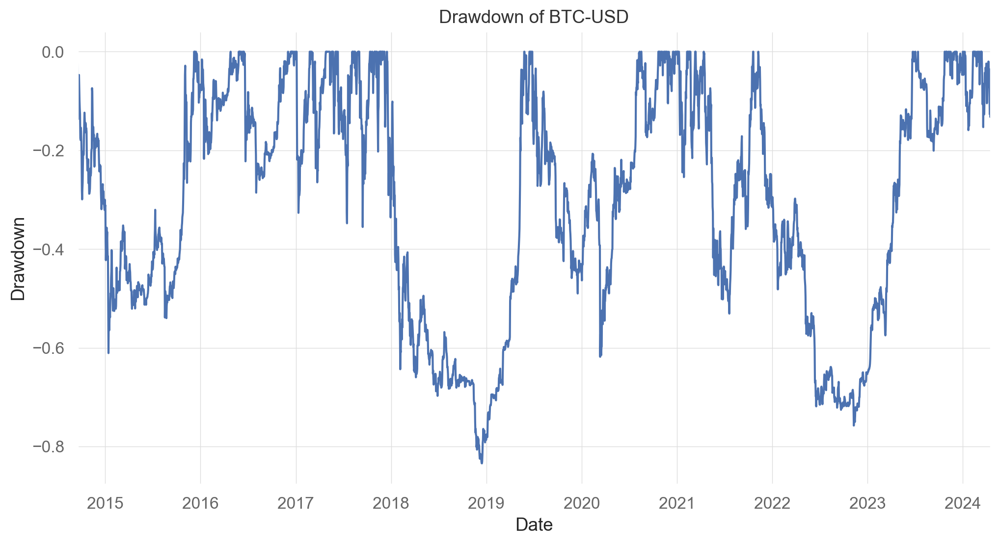

In [10]:
# Print bear market start and end dates
for bear_market in bear_markets:
    if len(bear_market) == 2:  # Ensure it has exactly two elements
        start, end = bear_market
        print(f"Bear market started on {start.strftime('%Y-%m-%d')} and ended on {end.strftime('%Y-%m-%d')}")
    else:
        print("Unexpected format in bear_markets:", bear_market)

# Plot the drawdown of BTC-USD
plt.figure(figsize=(12, 6))
filtered_btc['Drawdown'].plot()
plt.title('Drawdown of BTC-USD')
plt.xlabel('Date')
plt.ylabel('Drawdown')
plt.grid(True)
plt.show()


In [11]:

# Initialize results DataFrame
results = pd.DataFrame(columns=['Asset', 'Correlation', 'P-Value', 'N'])

# Calculate correlation and significance for each asset
for asset in tickers[:-1]:  # Exclude BTC-USD from ticker list
    btc_asset_data = data[['BTC-USD', asset]].dropna()  # Drop NaN values for both assets
    n = len(btc_asset_data)  # Sample size
    if n > 2:  # Ensure there is sufficient data
        correlation = btc_asset_data['BTC-USD'].corr(btc_asset_data[asset])  # Calculate correlation
        t_stat = correlation * np.sqrt((n - 2) / (1 - correlation**2))  # Calculate t-statistic
        p_value = stats.t.sf(np.abs(t_stat), n-2) * 2  # Calculate p-value (two-tailed)
        
        # Create a new row with the results
        result_row = pd.DataFrame({
            'Asset': [asset],
            'Correlation': [correlation],
            'P-Value': [p_value],
            'N': [n]
        })
        # Append result to the results DataFrame
        results = pd.concat([results, result_row], ignore_index=True)
    else:
        print(f"Insufficient data for asset {asset}")

# Display the results
print(results)
# Sort the results by correlation in descending order
results_sorted = results.sort_values(by='Correlation', ascending=False)
print(results_sorted)


    Asset  Correlation        P-Value     N
0    NVDA     0.782156   0.000000e+00  2411
1     TSM     0.935130   0.000000e+00  2411
2    AVGO     0.801125   0.000000e+00  2411
3    ASML     0.927414   0.000000e+00  2411
4     AMD     0.897567   0.000000e+00  2411
5    QCOM     0.890359   0.000000e+00  2411
6    AMAT     0.930652   0.000000e+00  2411
7    INTC     0.510292  5.142264e-160  2411
8     TXN     0.861886   0.000000e+00  2411
9      MU     0.900292   0.000000e+00  2411
10   LRCX     0.920008   0.000000e+00  2411
11  TOELY     0.941366   0.000000e+00  2411
12    ARM     0.909290   1.871725e-57   148
13    ADI     0.858002   0.000000e+00  2411
14   KLAC     0.859501   0.000000e+00  2411
15    APH     0.866740   0.000000e+00  2411
16   NXPI     0.918270   0.000000e+00  2411
17   MRVL     0.911451   0.000000e+00  2411
18   MCHP     0.874572   0.000000e+00  2411
19  IFNNY     0.870065   0.000000e+00  2411
20    TEL     0.906792   0.000000e+00  2411
21    STM     0.854727   0.00000

/var/folders/q7/rl1ql8s51w7g6407mjltrv0r0000gn/T/ipykernel_31367/2133301442.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results, result_row], ignore_index=True)


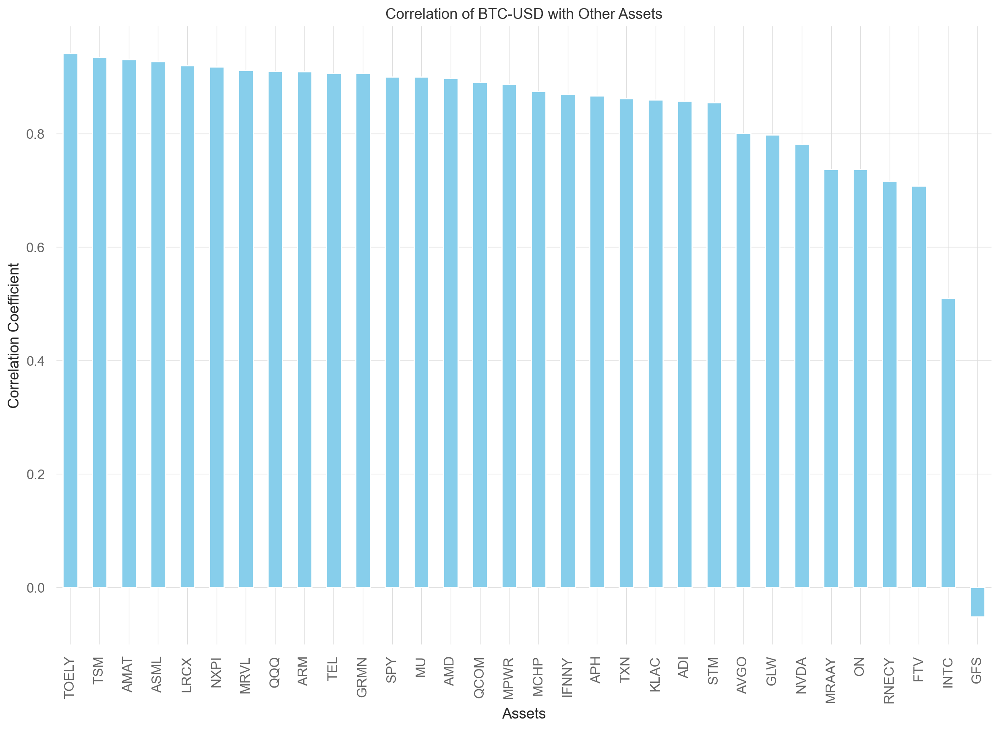

In [12]:

# Plot the sorted correlation coefficients
plt.figure(figsize=(15, 10))
results_sorted.set_index('Asset')['Correlation'].plot(kind='bar', color='skyblue')
plt.title('Correlation of BTC-USD with Other Assets')
plt.ylabel('Correlation Coefficient')
plt.xlabel('Assets')
plt.grid(True)
plt.show()


/var/folders/q7/rl1ql8s51w7g6407mjltrv0r0000gn/T/ipykernel_31367/963987434.py:18: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  annual_correlation = data_copy.groupby('year').apply(lambda x: x['BTC-USD'].corr(x[asset]))
/var/folders/q7/rl1ql8s51w7g6407mjltrv0r0000gn/T/ipykernel_31367/963987434.py:18: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  annual_correlation = data_copy.groupby('year').apply(lambda x:

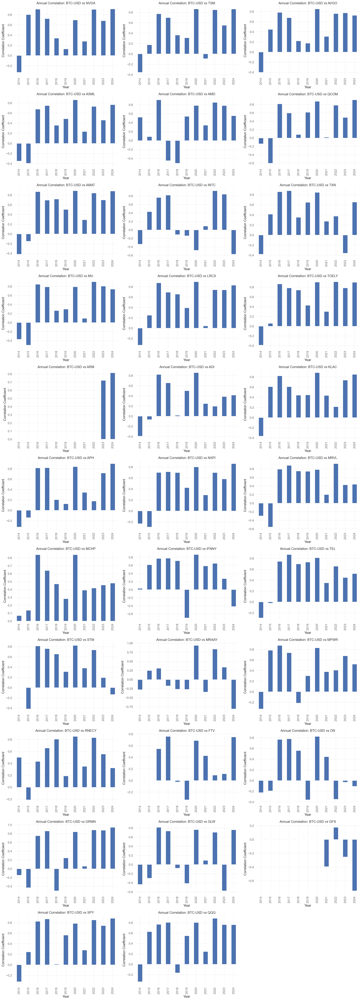

In [13]:

# Copy data and add a year column for annual correlation analysis
data_copy = data.copy()
data_copy['year'] = data_copy.index.year

# Determine the number of assets (excluding BTC-USD) and grid layout for subplots
num_assets = len(tickers) - 1
num_columns = 3
num_rows = (num_assets + num_columns - 1) // num_columns

# Create a subplot grid
fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(20, 5 * num_rows))
axes = axes.flatten()

# Plot the annual correlation between BTC-USD and each asset
for i, asset in enumerate(tickers[:-1]):  # Exclude BTC-USD
    if asset != 'BTC-USD':
        # Calculate annual correlation between BTC-USD and the current asset
        annual_correlation = data_copy.groupby('year').apply(lambda x: x['BTC-USD'].corr(x[asset]))
        
        # Plot the annual correlation in a bar chart
        ax = axes[i]
        annual_correlation.plot(kind='bar', ax=ax, title=f'Annual Correlation: BTC-USD vs {asset}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Correlation Coefficient')
    else:
        # Turn off axis for any missing assets
        axes[i].axis('off')

# Turn off any remaining unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout to ensure no overlapping
plt.tight_layout()
plt.show()


/var/folders/q7/rl1ql8s51w7g6407mjltrv0r0000gn/T/ipykernel_31367/2042291176.py:3: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = data.pct_change().dropna()
/var/folders/q7/rl1ql8s51w7g6407mjltrv0r0000gn/T/ipykernel_31367/2042291176.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  betas = pd.concat([betas, new_row], ignore_index=True)


    Asset      Beta
12    ARM  0.315104
23   MPWR  0.097104
26     ON  0.078704
19  IFNNY  0.077606
21    STM  0.067815
0    NVDA  0.060591
3    ASML  0.048262
27   GRMN  0.046418
28    GLW  0.043933
16   NXPI  0.043892
1     TSM  0.035909
4     AMD  0.035366
8     TXN  0.032407
5    QCOM  0.031527
15    APH  0.030251
31    QQQ  0.025932
17   MRVL  0.023148
30    SPY  0.021492
20    TEL  0.015215
2    AVGO  0.010663
13    ADI  0.010130
29    GFS  0.009541
22  MRAAY  0.004404
18   MCHP -0.000350
14   KLAC -0.008941
25    FTV -0.015307
10   LRCX -0.019498
9      MU -0.020469
6    AMAT -0.025032
7    INTC -0.028763
24  RNECY -0.030547
11  TOELY -0.041874


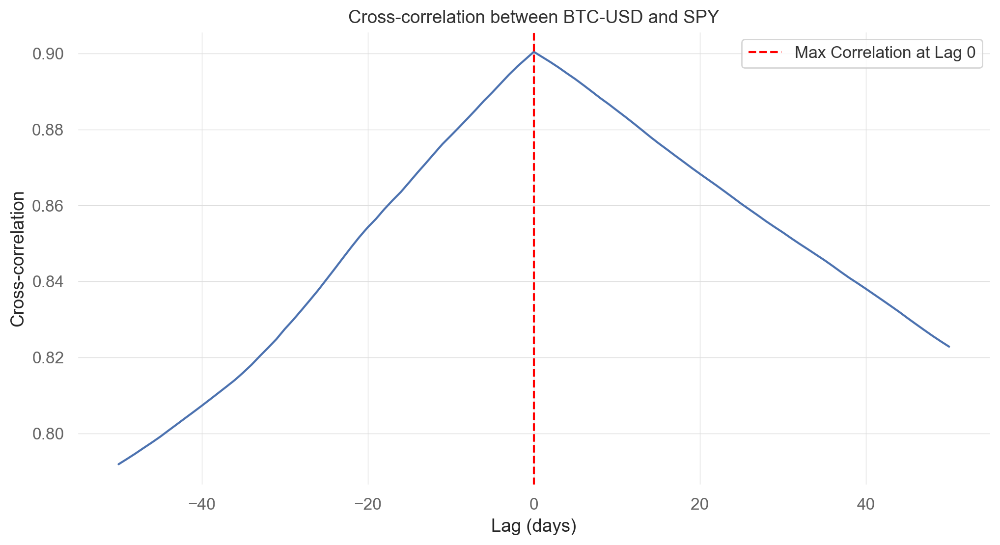

In [14]:

# Calculate daily returns for BTC-USD and all assets
BTC_returns = data['BTC-USD'].pct_change().dropna()
returns = data.pct_change().dropna()

# Initialize an empty DataFrame to store betas
betas = pd.DataFrame(columns=['Asset', 'Beta'])

# Calculate beta for each asset relative to BTC-USD
for asset in tickers:
    if asset != 'BTC-USD':  # Exclude BTC-USD from the comparison
        combined_returns = pd.DataFrame({
            'BTC-USD': BTC_returns,
            asset: returns[asset]
        }).dropna()  # Drop any missing values
        
        # Perform a linear regression of asset returns on BTC-USD returns
        X = sm.add_constant(combined_returns['BTC-USD'])
        y = combined_returns[asset]
        model = sm.OLS(y, X).fit()
        beta = model.params['BTC-USD']  # Extract the beta coefficient
        
        # Add the result to the betas DataFrame
        new_row = pd.DataFrame({'Asset': [asset], 'Beta': [beta]})
        betas = pd.concat([betas, new_row], ignore_index=True)

# Sort the betas in descending order
betas_sorted = betas.sort_values(by='Beta', ascending=False)
print(betas_sorted)

# Cross-correlation analysis between BTC-USD and SPY

# Retrieve BTC-USD and SPY prices and align by common dates
btc_prices = data['BTC-USD'].dropna()
spy_prices = data['SPY'].dropna()
common_dates = btc_prices.index.intersection(spy_prices.index)
btc_prices = btc_prices.loc[common_dates]
spy_prices = spy_prices.loc[common_dates]

# Set the range of lags for cross-correlation (-50 to +50 days)
lags = np.arange(-50, 51)

# Perform cross-correlation
corr = correlate(btc_prices - btc_prices.mean(), spy_prices - spy_prices.mean(), mode='full')

# Normalize the correlation result
corr /= (np.std(btc_prices) * np.std(spy_prices) * len(btc_prices))

# The result `corr` contains the correlation values at different lags
# Center the correlation results around zero lag
center = len(corr) // 2
corr = corr[center - 50 : center + 51]  # Keep only the lags from -50 to +50

# Find the lag with the maximum absolute correlation
lag_max_corr = lags[np.argmax(np.abs(corr))]

# Plot the cross-correlation
plt.figure(figsize=(12, 6))
plt.plot(lags, corr)
plt.title('Cross-correlation between BTC-USD and SPY')
plt.xlabel('Lag (days)')
plt.ylabel('Cross-correlation')
plt.axvline(lag_max_corr, color='red', linestyle='--', label=f'Max Correlation at Lag {lag_max_corr}')
plt.legend()
plt.grid(True)
plt.show()


The maximum correlation is at lag 0 days.
Pearson correlation coefficient: 0.126598767570736
p-value: 0.005331288239186798


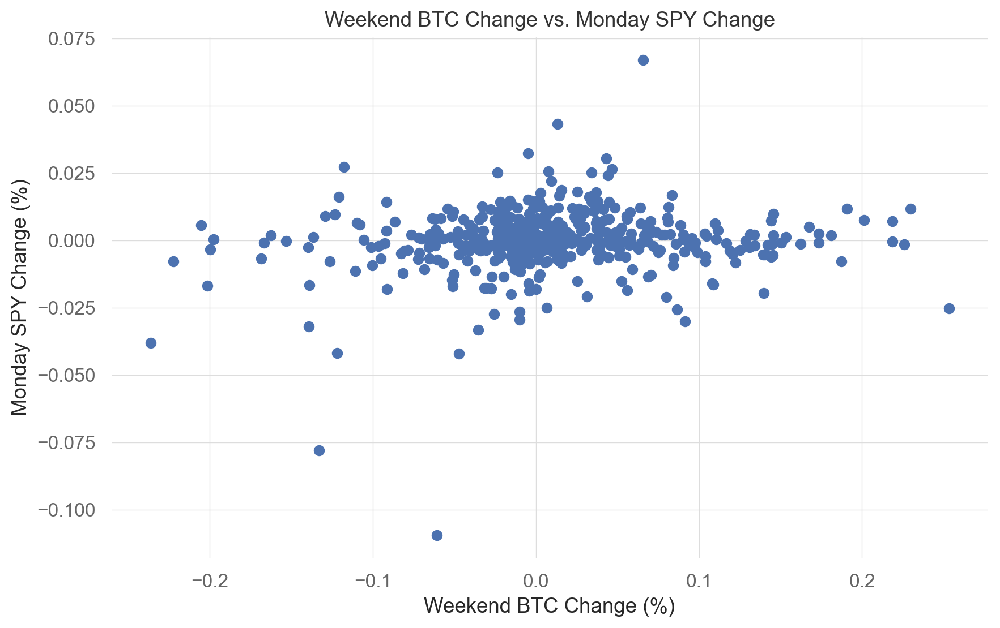

In [15]:

# Print the maximum correlation lag
print(f"The maximum correlation is at lag {lag_max_corr} days.")

# Analyze the weekend effect for BTC-USD and SPY
btc_prices_weekday = btc_prices.index.to_series().dt.dayofweek
spy_prices_weekday = spy_prices.index.to_series().dt.dayofweek

# Get Friday's close prices for BTC-USD
btc_friday_close = btc_prices[btc_prices_weekday == 4]

# Get Sunday close prices for BTC-USD (shifted by -2 days)
btc_sunday_close = btc_prices.shift(-2)[btc_prices_weekday == 4]

# Calculate the weekend change for BTC-USD
btc_weekend_change = (btc_sunday_close - btc_friday_close) / btc_friday_close

# Get Monday's open prices for SPY (shifted by -1 day)
spy_monday_open = spy_prices.shift(-1)[spy_prices_weekday == 4]

# Get Friday's close prices for SPY
spy_friday_close = spy_prices[spy_prices_weekday == 4]

# Calculate the Monday change for SPY
spy_monday_change = (spy_monday_open - spy_friday_close) / spy_friday_close

# Drop NaN values from the weekend and Monday change calculations
btc_weekend_change = btc_weekend_change.dropna()
spy_monday_change = spy_monday_change.dropna()

# Align the weekend changes by common dates
common_dates = btc_weekend_change.index.intersection(spy_monday_change.index)
btc_weekend_change = btc_weekend_change.loc[common_dates]
spy_monday_change = spy_monday_change.loc[common_dates]
# Calculate Pearson correlation coefficient and p-value
correlation_coefficient, p_value = pearsonr(btc_weekend_change, spy_monday_change)

print(f'Pearson correlation coefficient: {correlation_coefficient}')
print(f'p-value: {p_value}')

# Scatter plot for Weekend BTC Change vs. Monday SPY Change
plt.figure(figsize=(10, 6))
plt.scatter(btc_weekend_change, spy_monday_change)
plt.title('Weekend BTC Change vs. Monday SPY Change')
plt.xlabel('Weekend BTC Change (%)')
plt.ylabel('Monday SPY Change (%)')
plt.grid(True)
plt.show()


In [16]:

# Define halving dates for Bitcoin
halving_dates = ["2016-07-09", "2020-05-11"]

# Define periods to analyze returns after halving
periods = {
    '1m': pd.DateOffset(months=1),
    '3m': pd.DateOffset(months=3),
    '6m': pd.DateOffset(months=6),
    '1y': pd.DateOffset(years=1)
}

# Create a DataFrame to hold returns data
returns = pd.DataFrame(columns=['Date', 'Asset', 'Period', 'Return'])

# Analyze returns for each halving date
for date in halving_dates:
    for ticker in tickers:
        start_price = data.loc[date:].iloc[0].get(ticker, np.nan)
        for period, offset in periods.items():
            end_date = pd.Timestamp(date) + offset
            end_price = data.loc[:end_date].iloc[-1].get(ticker, np.nan)
            if pd.notna(start_price) and pd.notna(end_price):
                log_return = np.log(end_price / start_price)
                results_row = pd.DataFrame({
                    'Date': [date],
                    'Asset': [ticker],
                    'Period': [period],
                    'Return': [log_return]
                })
                returns = pd.concat([returns, results_row], ignore_index=True)

# Display the results
print(returns)


           Date    Asset Period    Return
0    2016-07-09  BTC-USD     1m -0.102060
1    2016-07-09  BTC-USD     3m -0.053981
2    2016-07-09  BTC-USD     6m  0.327084
3    2016-07-09  BTC-USD     1y  1.352947
4    2020-05-11     NVDA     1m  0.087186
..          ...      ...    ...       ...
123  2020-05-11      QQQ     1y  0.365212
124  2020-05-11  BTC-USD     1m  0.080383
125  2020-05-11  BTC-USD     3m  0.282565
126  2020-05-11  BTC-USD     6m  0.601775
127  2020-05-11  BTC-USD     1y  1.885884

[128 rows x 4 columns]


/var/folders/q7/rl1ql8s51w7g6407mjltrv0r0000gn/T/ipykernel_31367/1703862946.py:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  returns = pd.concat([returns, results_row], ignore_index=True)


/Users/nilkanthpatel/anaconda3/envs/FINA6339/lib/python3.11/site-packages/yfinance/utils.py:775: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/Users/nilkanthpatel/anaconda3/envs/FINA6339/lib/python3.11/site-packages/yfinance/utils.py:775: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/Users/nilkanthpatel/anaconda3/envs/FINA6339/lib/python3.11/site-packages/yfinance/utils.py:775: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
/Users/nilkanthpatel/anaconda3/envs/FINA6339/lib/python3.11/site-packages/yfinance/utils.py:775: 

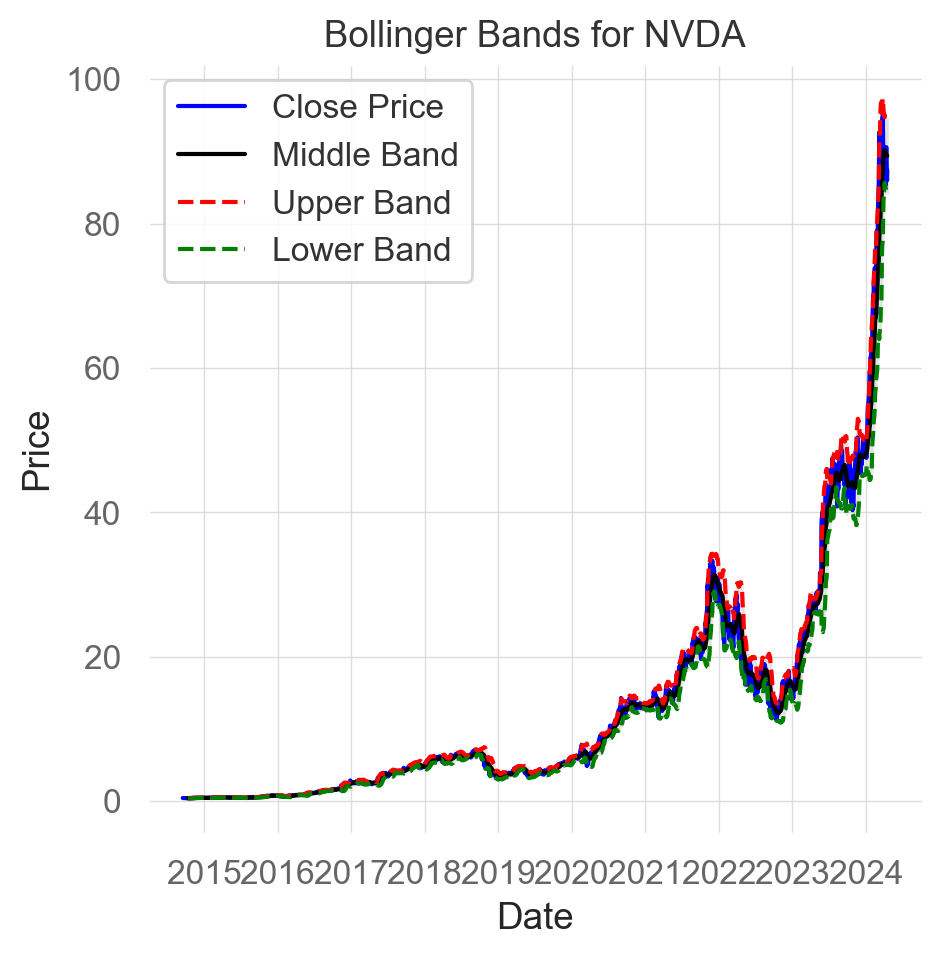

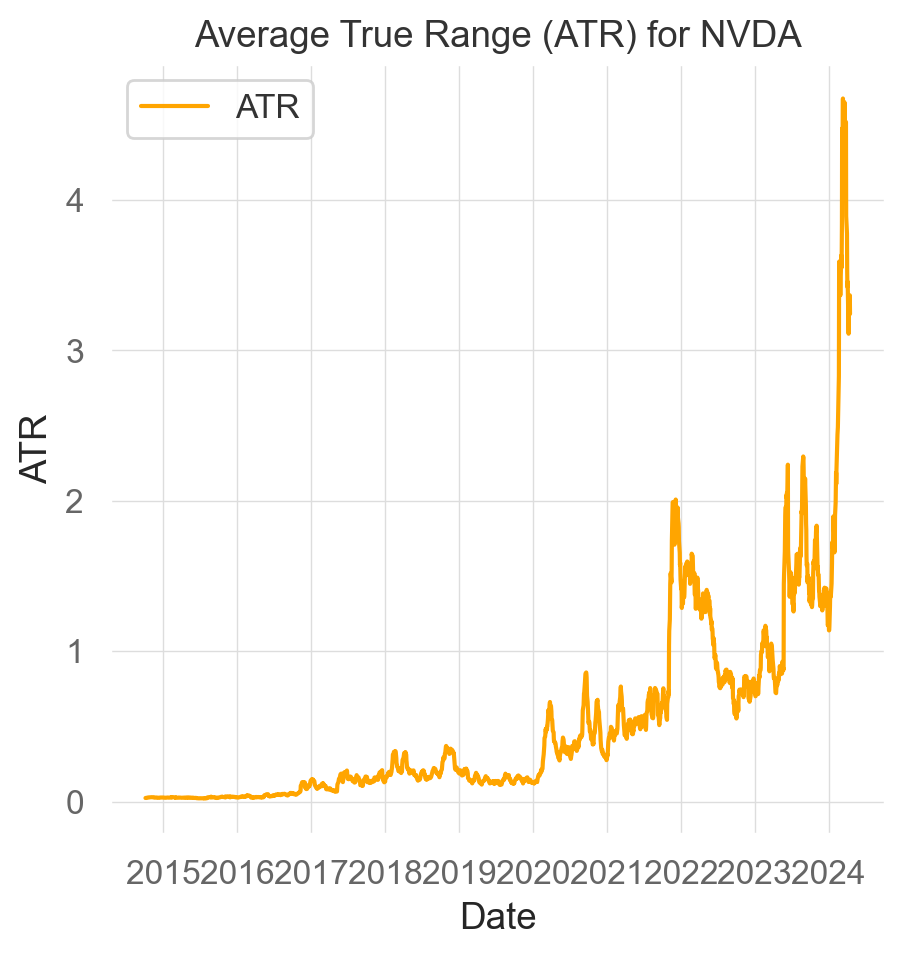

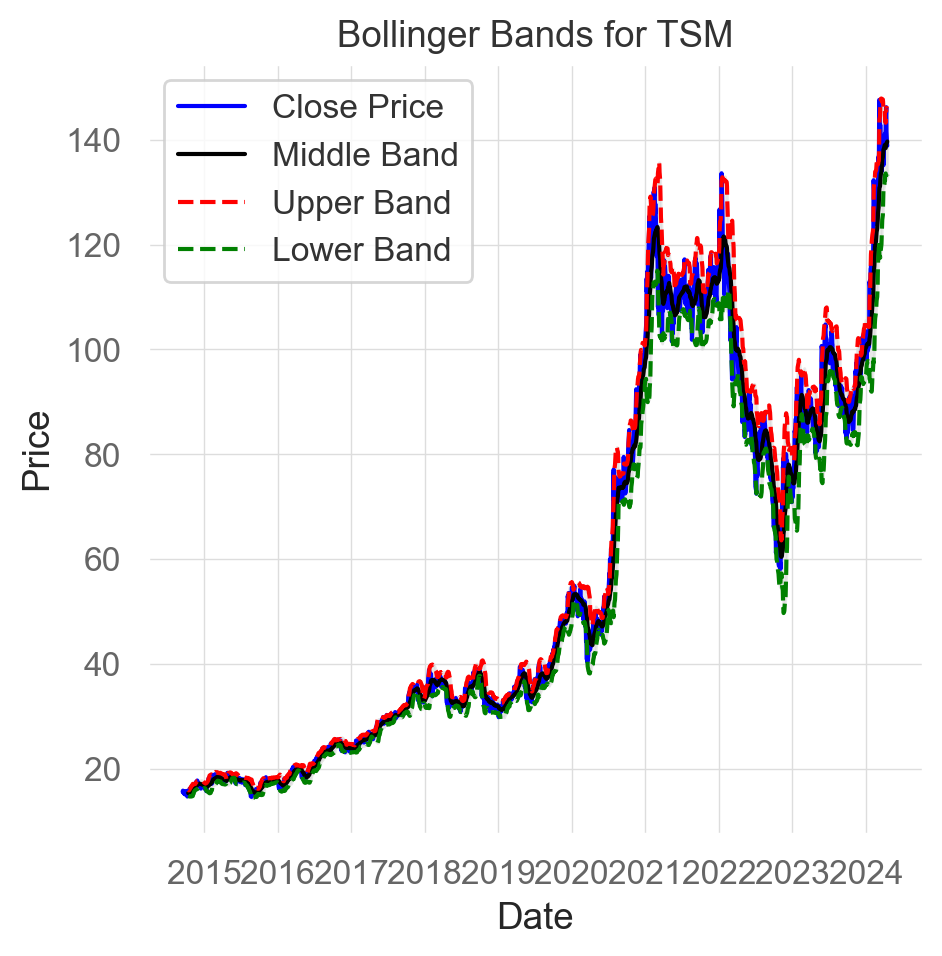

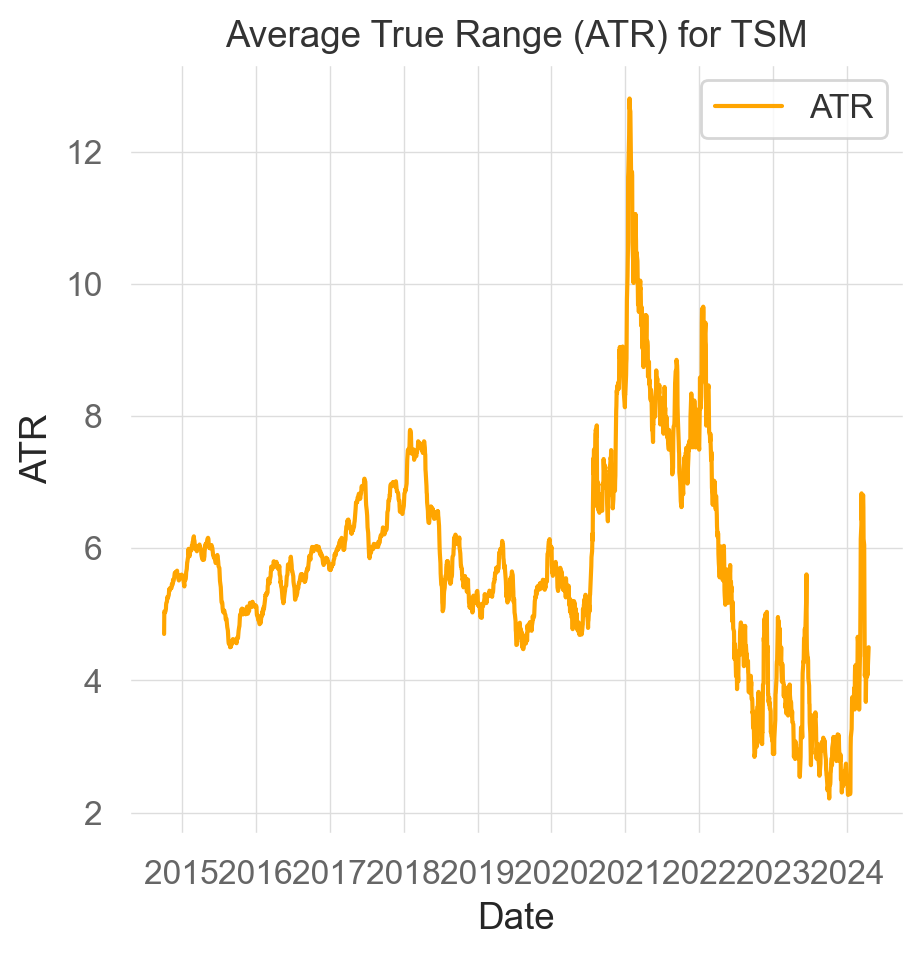

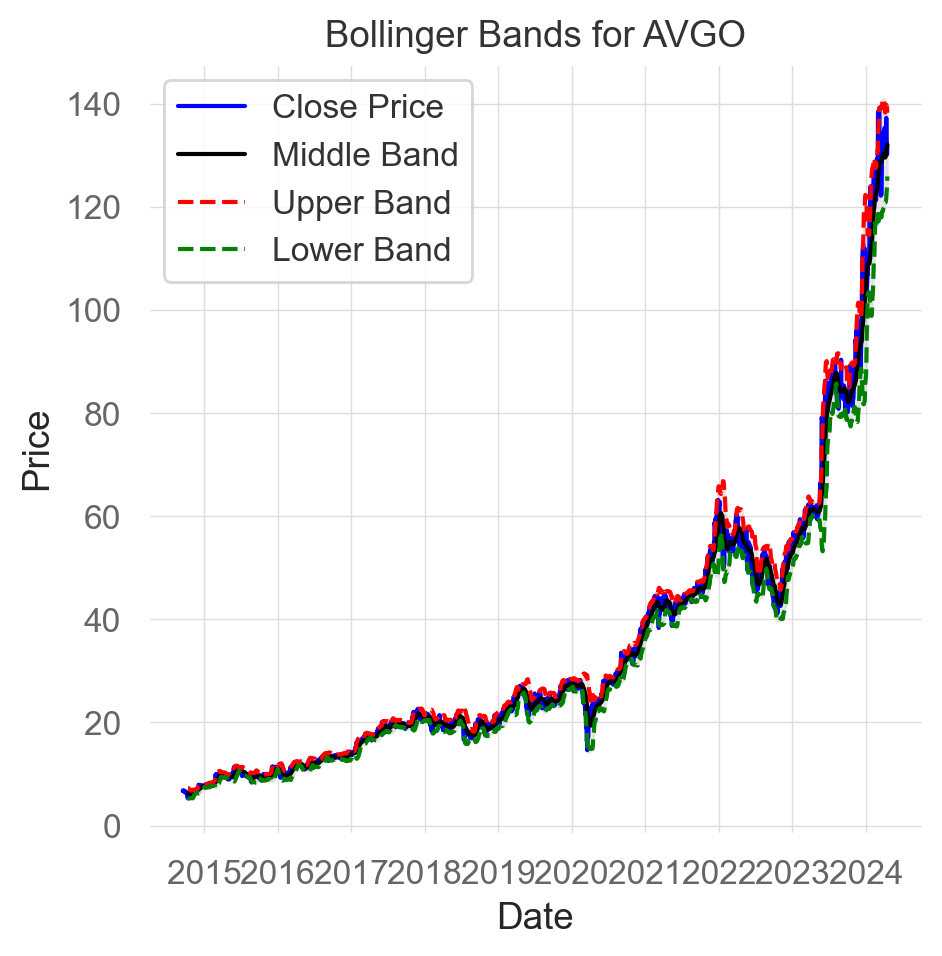

...

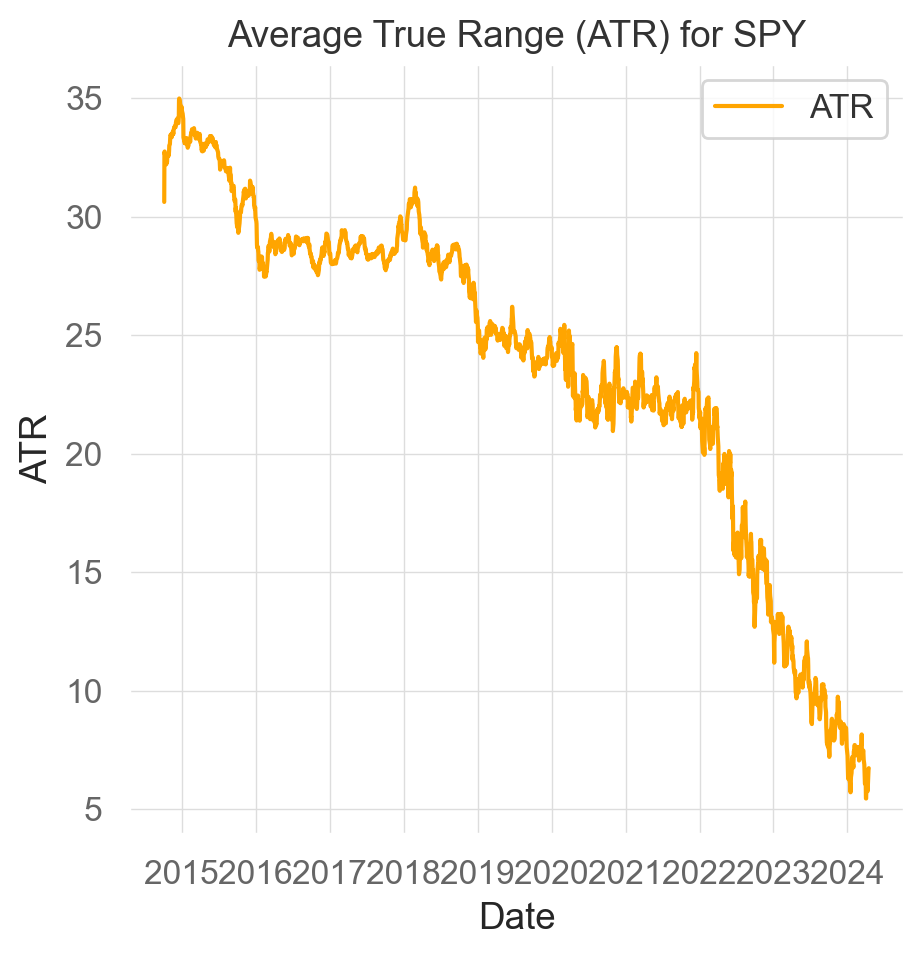

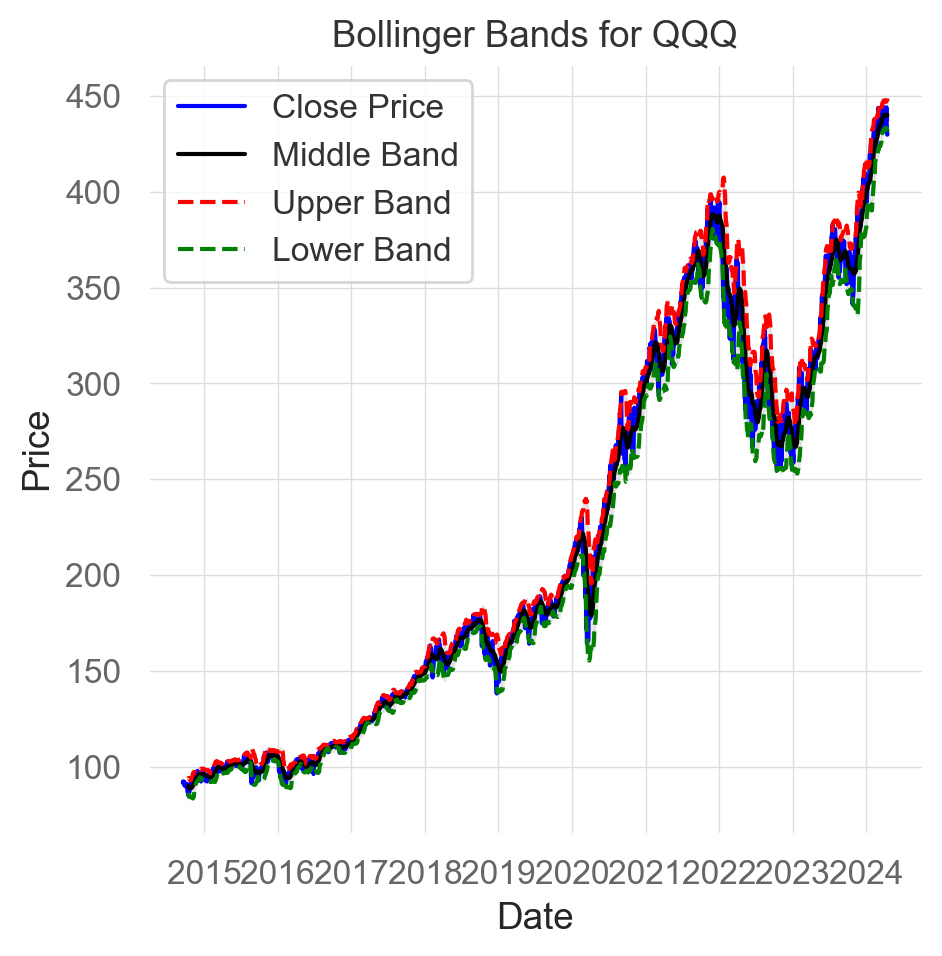

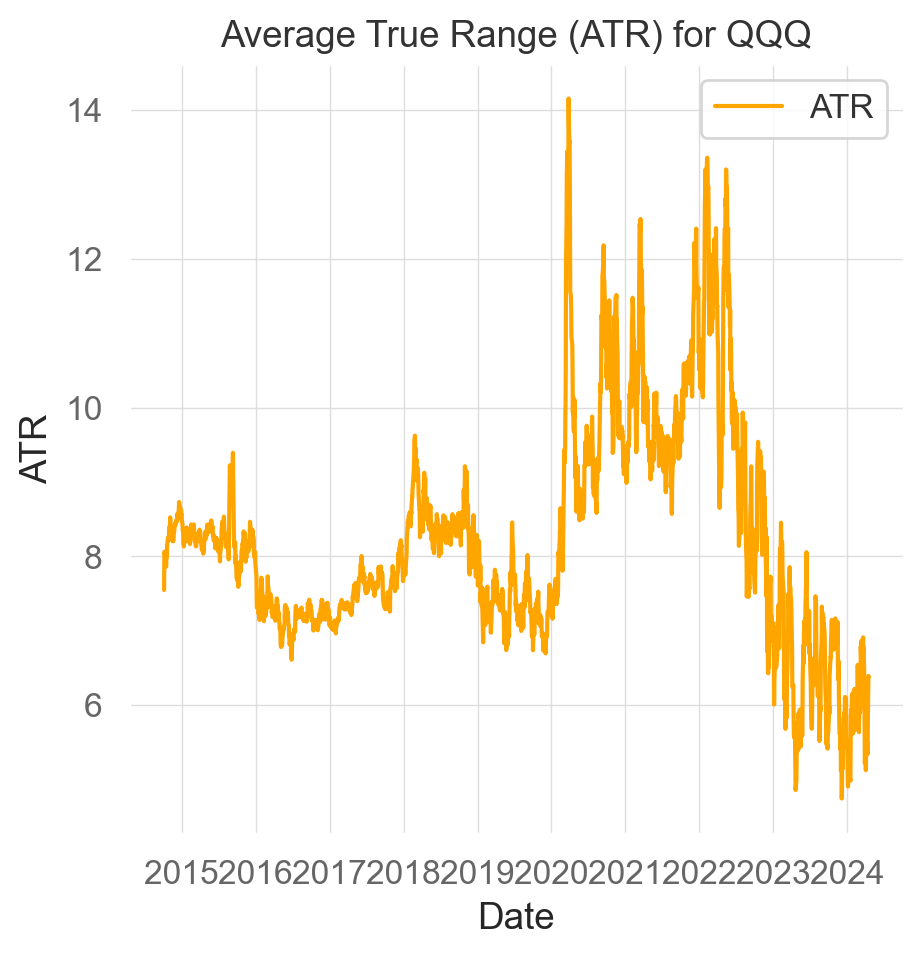

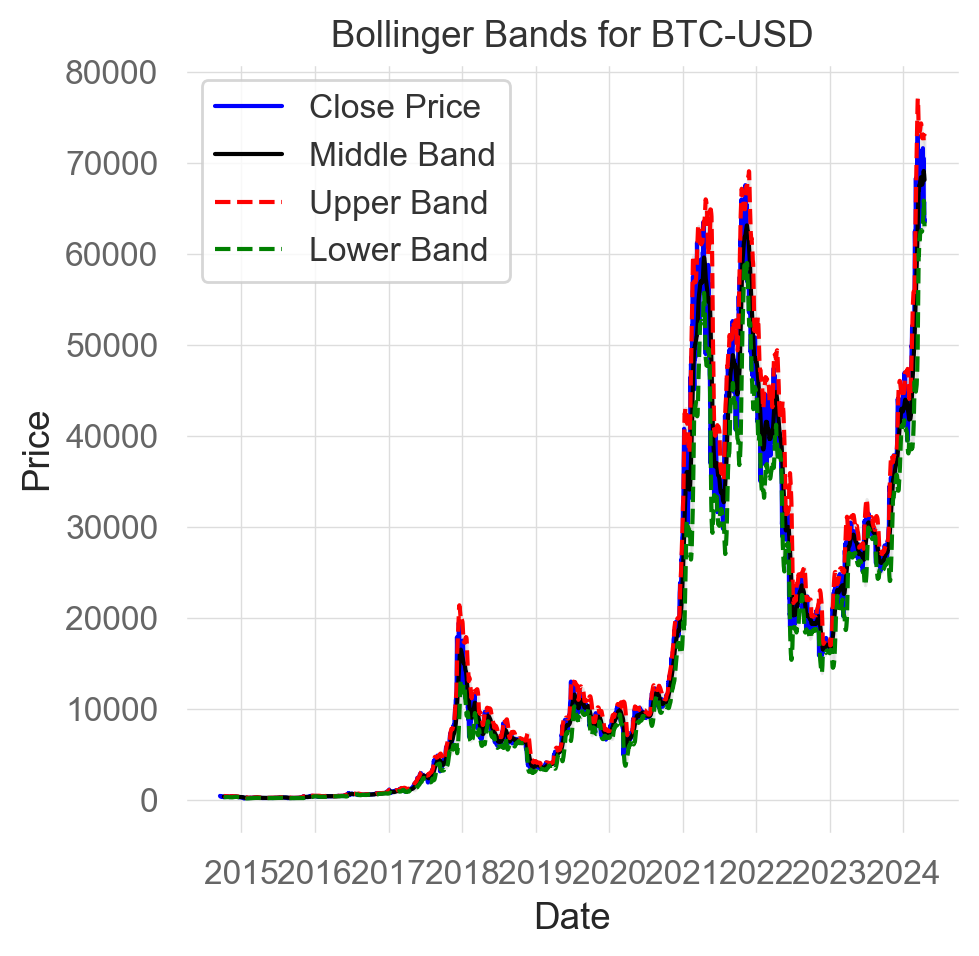

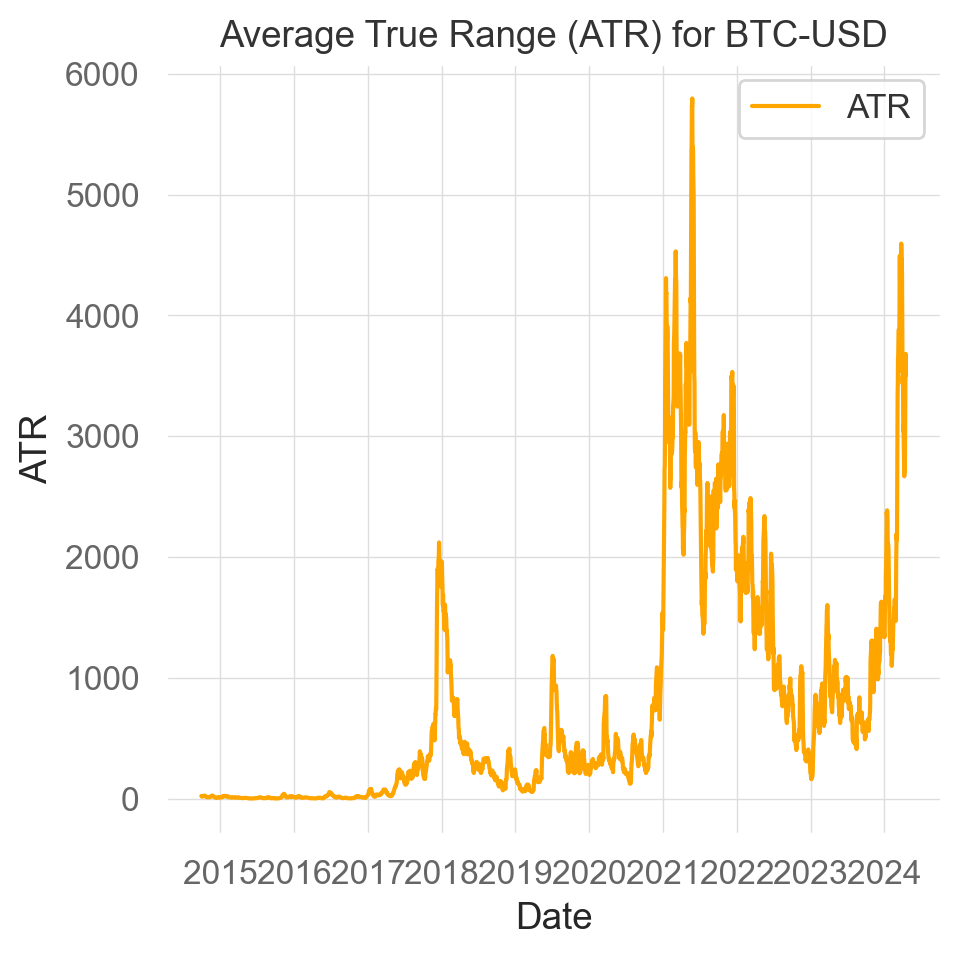

In [18]:


# List of tickers
tickers = [
    "NVDA", "TSM", "AVGO", "ASML", "AMD", "QCOM", "AMAT", "INTC",
    "TXN", "MU", "LRCX", "TOELY", "ARM", "ADI", "KLAC", "APH", 
    "NXPI", "MRVL", "MCHP", "IFNNY", "TEL", "STM", "MRAAY", 
    "MPWR", "RNECY", "FTV", "ON", "GRMN", "GLW", "GFS", "SPY", 
    "QQQ", "BTC-USD"
]

# Define date range
start_date = '2014-09-17'
end_date = '2024-04-17'

# Download data
data = yf.download(tickers, start=start_date, end=end_date)

# Calculate Bollinger Bands and ATR for each ticker
for ticker in tickers:
    # Extract ticker data
    ticker_data = data.loc[:, (slice(None), ticker)].dropna()
    ticker_data.columns = ticker_data.columns.droplevel(1)
    
    # Calculate Bollinger Bands
    ticker_data['Middle Band'] = ticker_data['Adj Close'].rolling(window=20).mean()
    ticker_data['Upper Band'] = ticker_data['Middle Band'] + 1.96 * ticker_data['Adj Close'].rolling(window=20).std()
    ticker_data['Lower Band'] = ticker_data['Middle Band'] - 1.96 * ticker_data['Adj Close'].rolling(window=20).std()
    
    # Calculate True Range and Average True Range (ATR)
    ticker_data['HL'] = ticker_data['High'] - ticker_data['Low']
    ticker_data['absHC'] = abs(ticker_data['High'] - ticker_data['Adj Close'].shift())
    ticker_data['absLC'] = abs(ticker_data['Low'] - ticker_data['Adj Close'].shift())
    ticker_data['TR'] = ticker_data[['HL', 'absHC', 'absLC']].max(axis=1)
    ticker_data['ATR'] = ticker_data['TR'].rolling(window=14).mean()
    
    # Plot Bollinger Bands
    plt.figure(figsize=(5, 5))
    plt.title(f'Bollinger Bands for {ticker}')
    plt.plot(ticker_data['Adj Close'], label='Close Price', color='blue')
    plt.plot(ticker_data['Middle Band'], label='Middle Band', color='black')
    plt.plot(ticker_data['Upper Band'], label='Upper Band', color='red', linestyle='--')
    plt.plot(ticker_data['Lower Band'], label='Lower Band', color='green', linestyle='--')
    plt.fill_between(ticker_data.index, ticker_data['Upper Band'], ticker_data['Lower Band'], color='lightgrey', alpha=0.5)
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot ATR
    plt.figure(figsize=(5, 5))
    plt.title(f'Average True Range (ATR) for {ticker}')
    plt.plot(ticker_data['ATR'], label='ATR', color='orange')
    plt.xlabel('Date')
    plt.ylabel('ATR')
    plt.legend()
    plt.grid(True)
    plt.show()
